In [17]:
import os

import numpy as np
import matplotlib.pyplot as plt

from scipy.ndimage.morphology import binary_opening, binary_closing, binary_dilation
from scipy.ndimage import label, find_objects



In [32]:

print(np.random.choice(np.arange(1,20)))

16


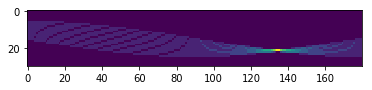

Detected angle in radians: [0.78101046]
Detected angle in degrees: 44.74860335195531


In [27]:
import os
import math

import numpy as np
import matplotlib.pyplot as plt

from skimage.measure import block_reduce
from scipy.ndimage.morphology import binary_erosion
from skimage.transform import hough_line, hough_line_peaks

img = np.array([[0,0,0,0,0,0,0,0,0,1],
                [0,0,0,0,0,0,0,0,1,0],
                [0,0,0,0,0,0,0,1,0,0],
                [0,0,0,0,0,0,1,0,0,0],
                [0,0,0,0,0,1,0,0,0,0],
                [0,0,0,0,1,0,0,0,0,0],
                [0,0,0,1,0,0,0,0,0,0],
                [0,0,1,0,0,0,0,0,0,0],
                [0,1,0,0,0,0,0,0,0,0],
                [1,0,0,0,0,0,0,0,0,0]])

h_space, angles, distances = hough_line(img)
accu, angle, dist = hough_line_peaks(h_space, angles, distances, num_peaks=1)

plt.figure()
plt.imshow(h_space)
plt.show()

print("Detected angle in radians:",angle)
print("Detected angle in degrees:",math.degrees(angle))

In [18]:
img_dir = "preprocessing_images/"
target_dir = "clean_images/"

avg_width = 160
avg_height = 1050

max_width = 250
max_height = 1200

Date: 190411
Batch: 873
Photo: 0
<class 'numpy.ndarray'>
[215 185 170]
[30 40 46]
[33 43 47]
(1376, 1040, 3)


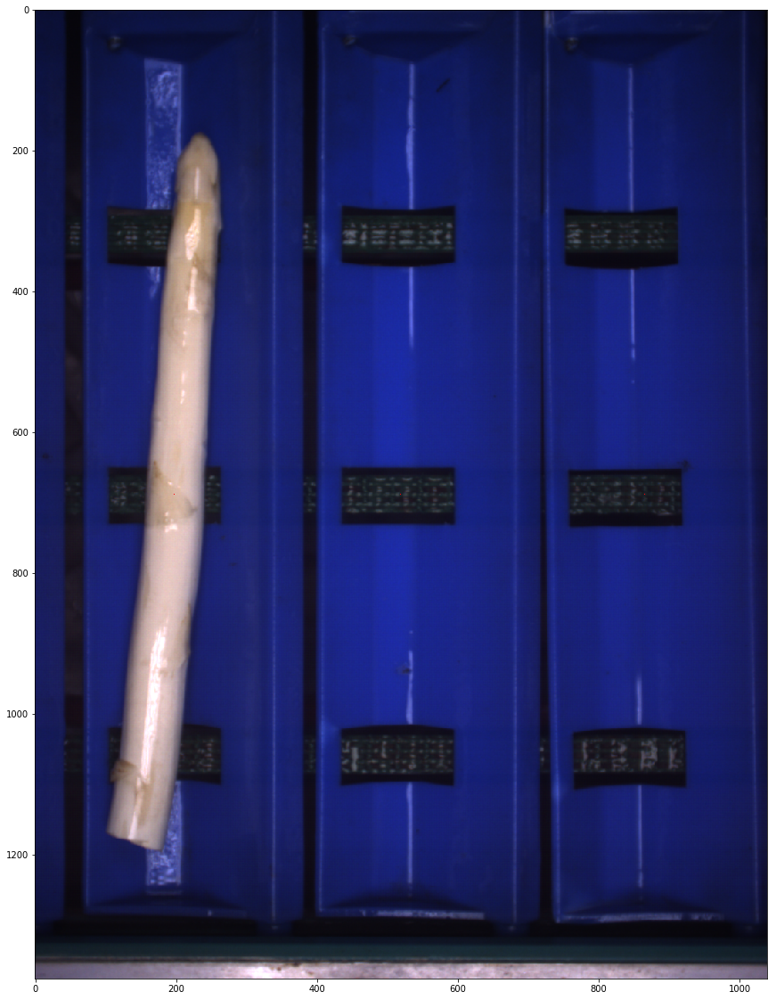

Date: 190411
Batch: 873
Photo: 1
<class 'numpy.ndarray'>
[44 60 62]
[205 181 184]
[35 35 40]
(1376, 1040, 3)


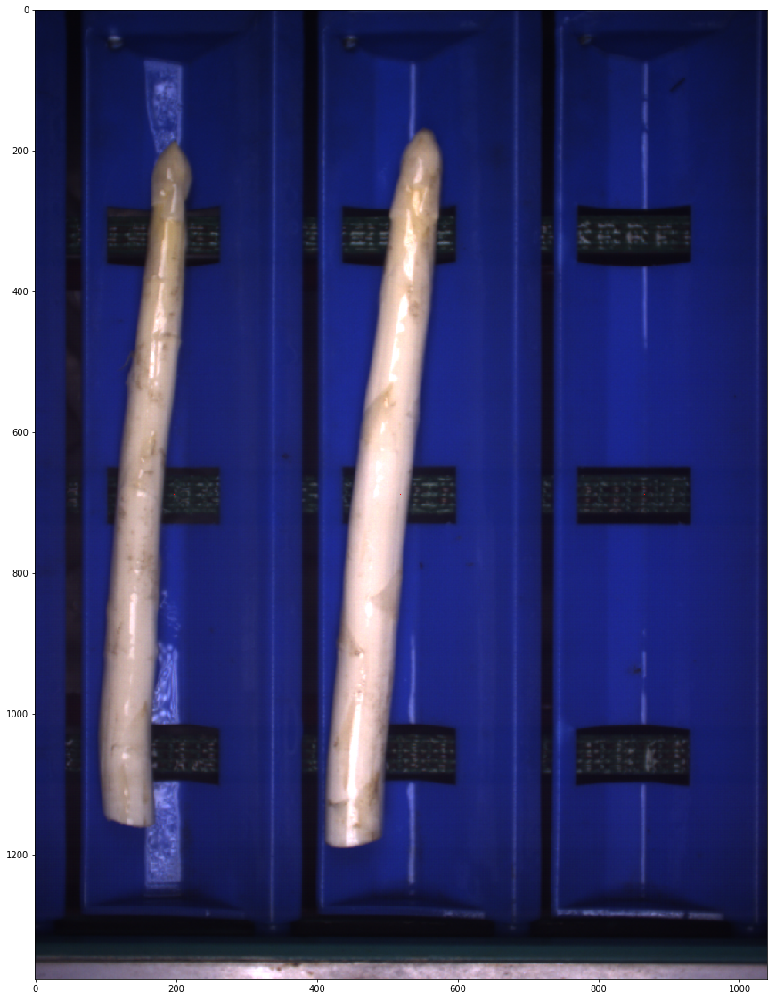

Date: 190411
Batch: 873
Photo: 2
<class 'numpy.ndarray'>
[32 38 42]
[118 105 117]
[147 128 134]
(1376, 1040, 3)


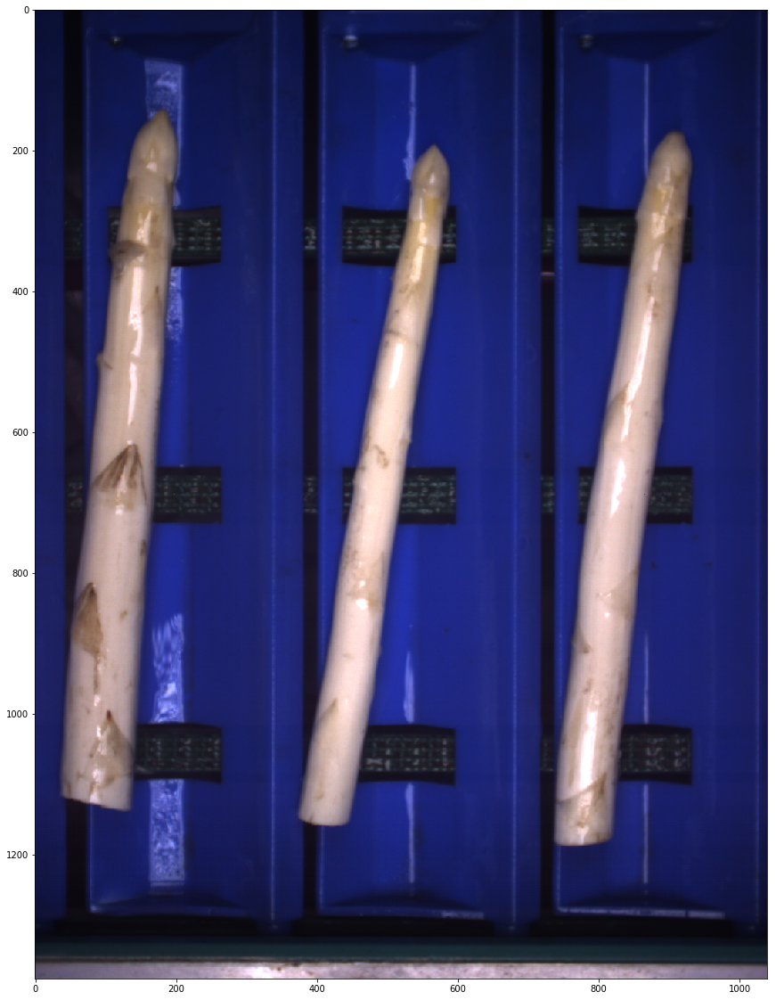

Date: 190411
Batch: 874
Photo: 2
<class 'numpy.ndarray'>
[200 176 163]
[163 128 104]
[91 83 91]
(1376, 1040, 3)


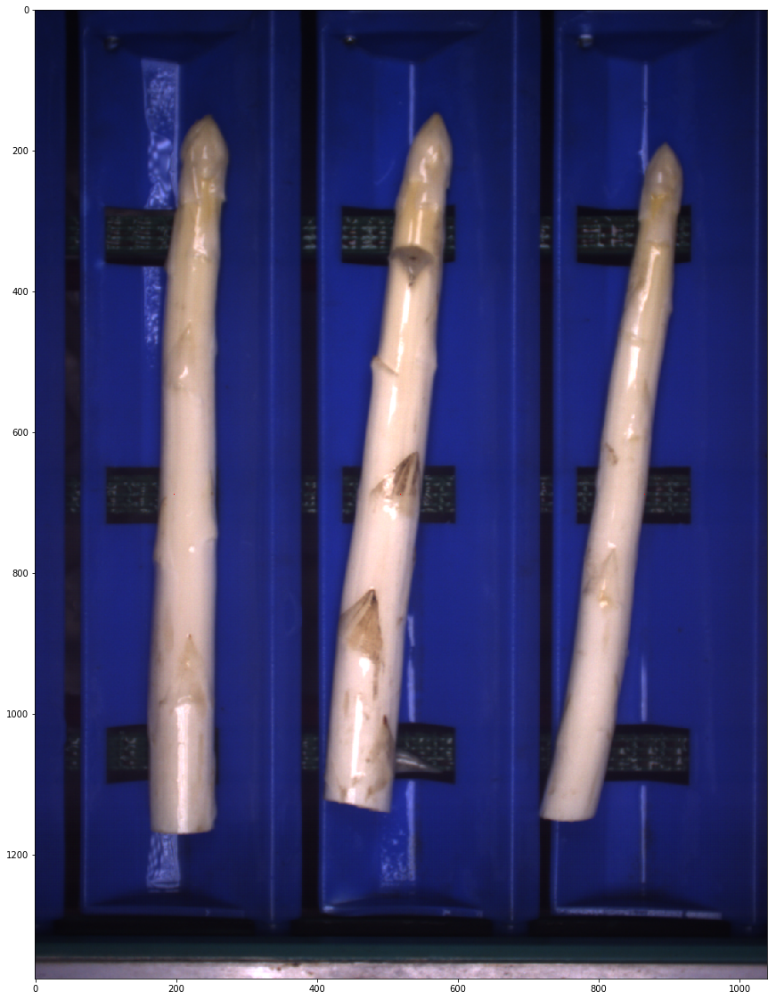

Date: 190411
Batch: 875
Photo: 2
<class 'numpy.ndarray'>
[33 38 44]
[58 58 76]
[184 158 151]
(1376, 1040, 3)


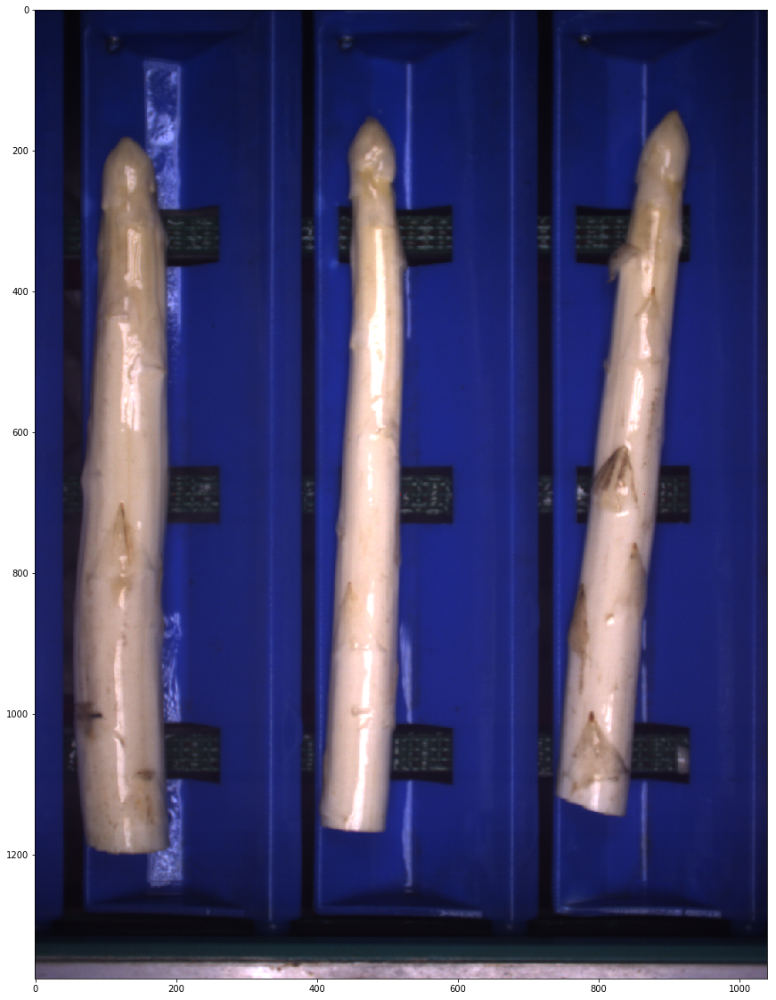

Date: 190411
Batch: 876
Photo: 2
<class 'numpy.ndarray'>
[31 32 40]
[246 210 189]
[240 212 201]
(1376, 1040, 3)


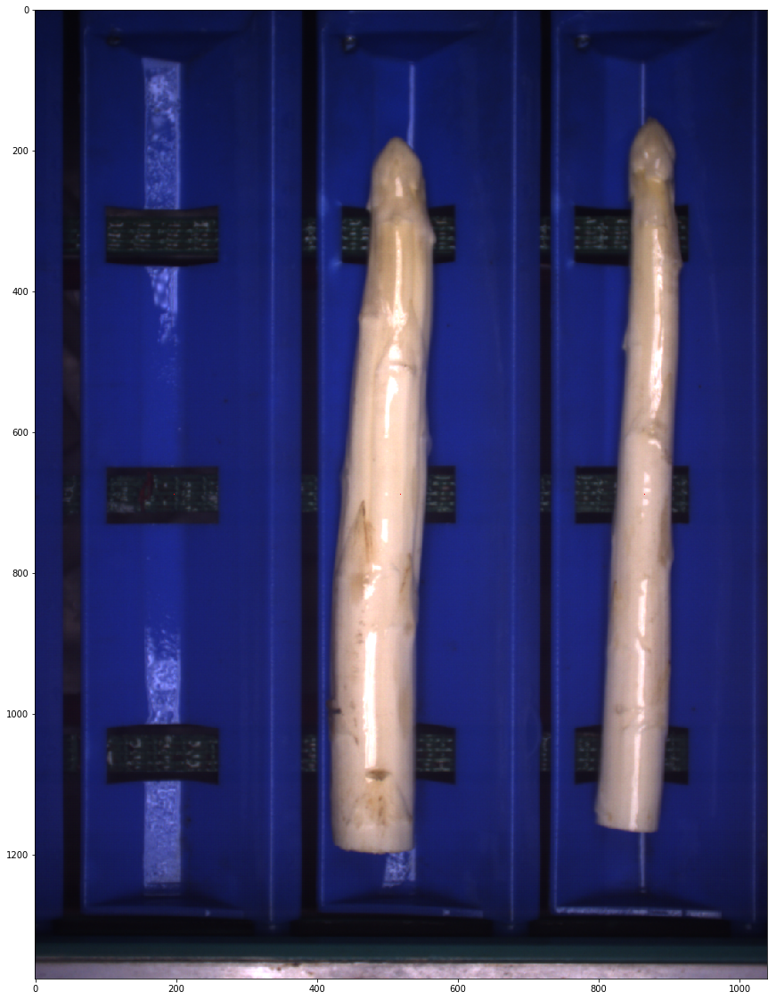

Date: 190411
Batch: 877
Photo: 2
<class 'numpy.ndarray'>
[29 37 43]
[49 57 66]
[224 184 157]
(1376, 1040, 3)


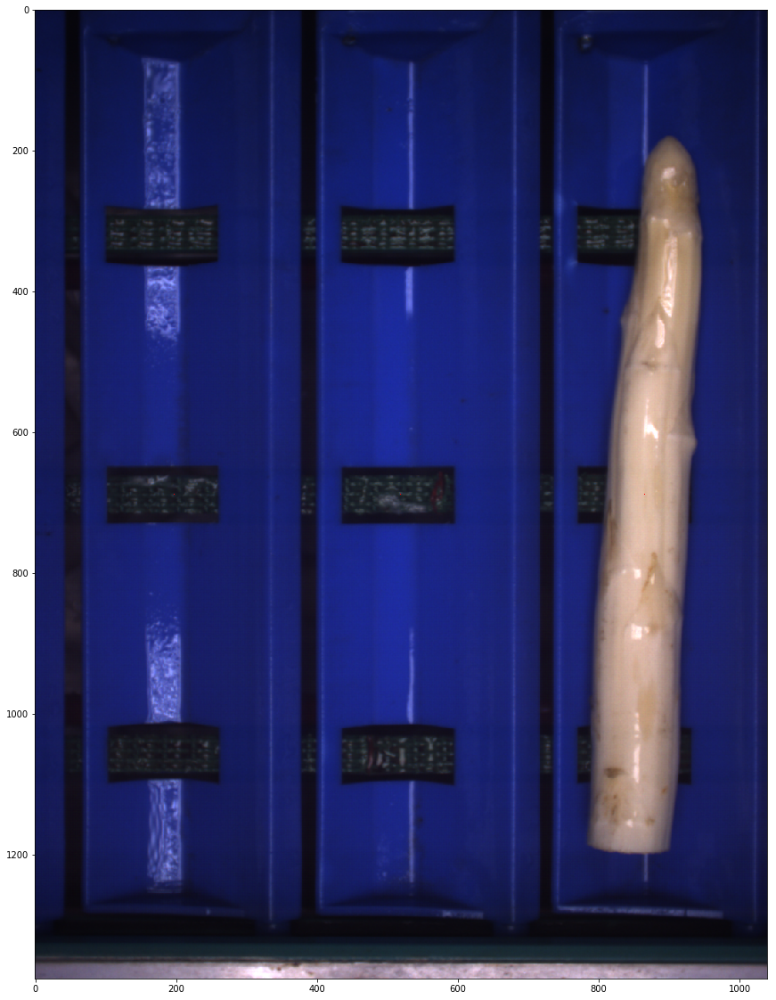

Date: 190411
Batch: 887
Photo: 0
<class 'numpy.ndarray'>
[133 121 121]
[68 70 72]
[45 54 52]
(1376, 1040, 3)


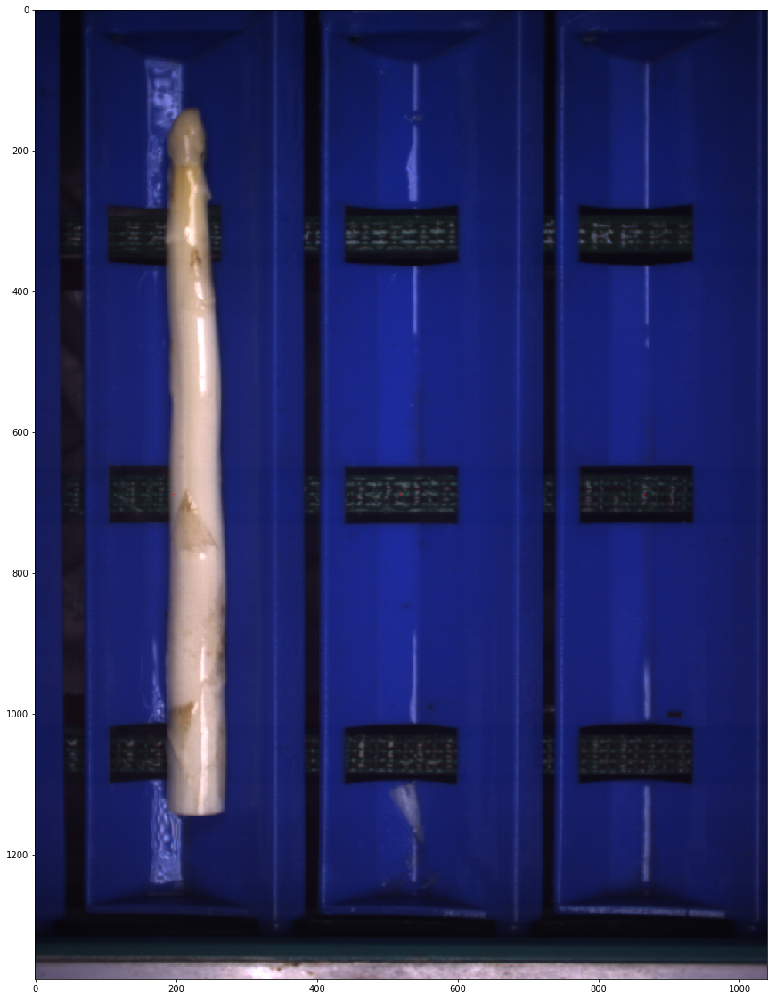

Date: 190411
Batch: 887
Photo: 1
<class 'numpy.ndarray'>
[175 156 155]
[255 232 219]
[26 28 34]
(1376, 1040, 3)


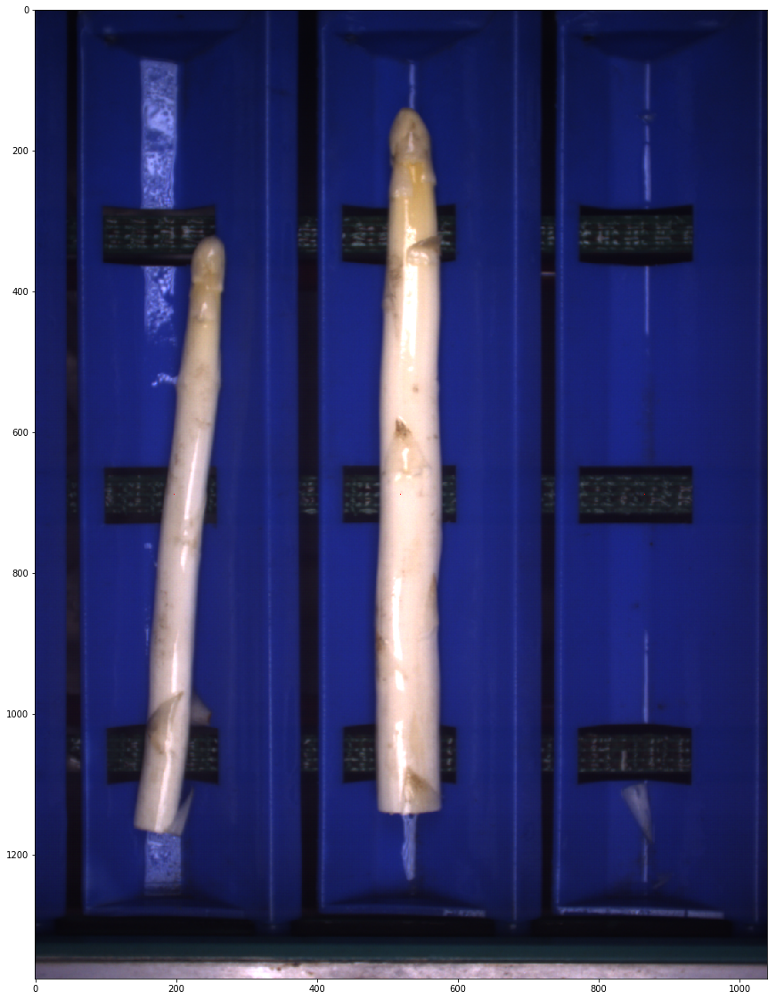

Date: 190411
Batch: 887
Photo: 2
<class 'numpy.ndarray'>
[31 37 43]
[255 235 232]
[37 42 44]
(1376, 1040, 3)


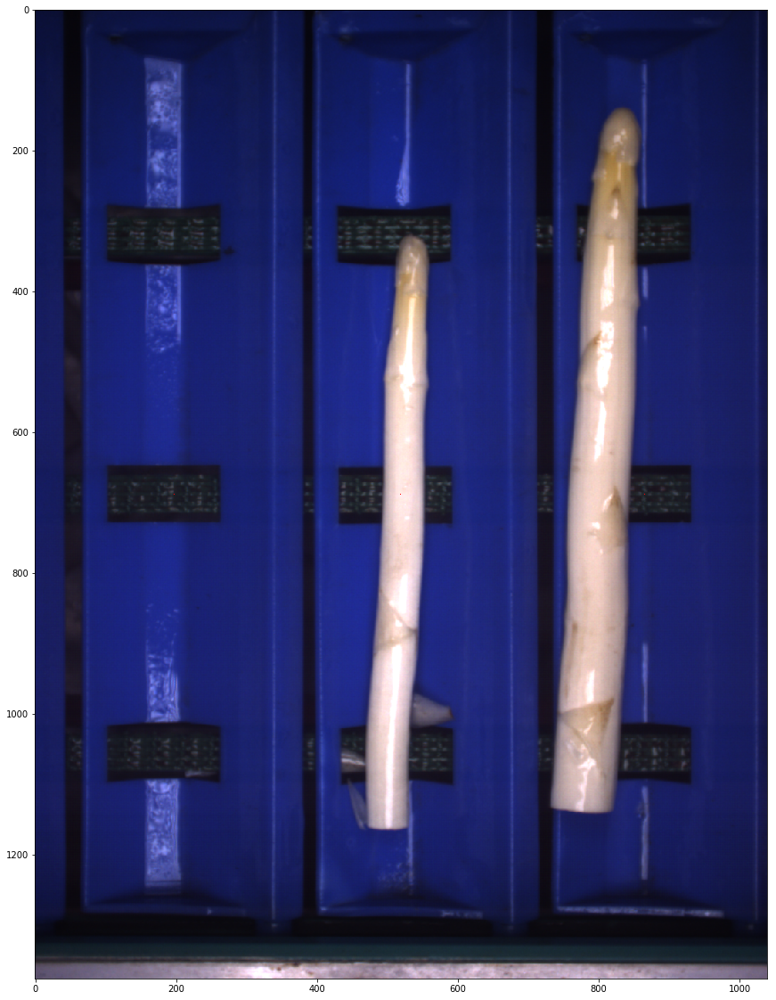

Date: 190411
Batch: 888
Photo: 2
<class 'numpy.ndarray'>
[141 131 131]
[32 38 46]
[119 105 113]
(1376, 1040, 3)


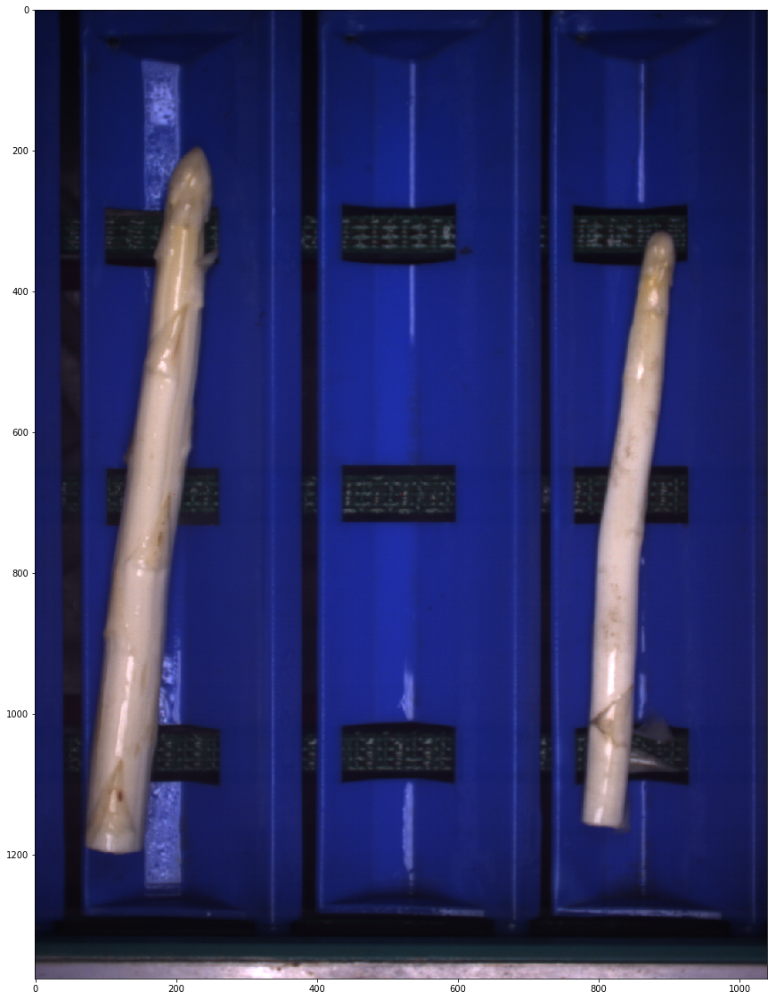

Date: 190411
Batch: 890
Photo: 1
<class 'numpy.ndarray'>
[199 172 156]
[247 211 201]
[36 37 43]
(1376, 1040, 3)


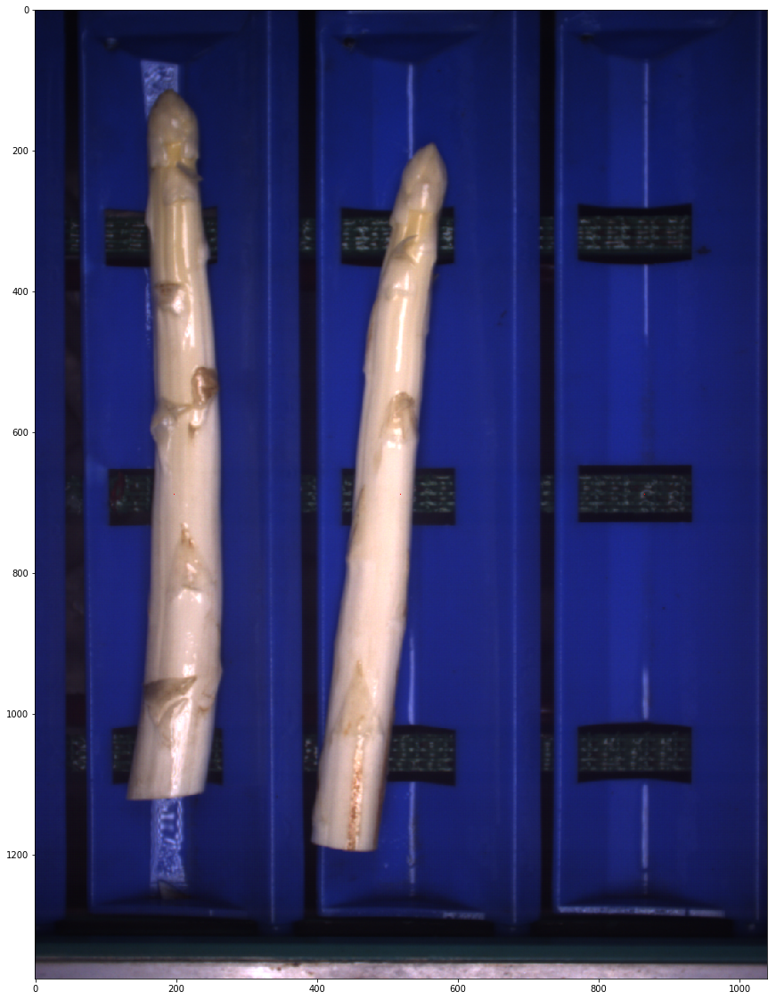

Date: 190411
Batch: 890
Photo: 2
<class 'numpy.ndarray'>
[118 111 124]
[126 108 112]
[213 181 170]
(1376, 1040, 3)


KeyboardInterrupt: 

In [19]:
for subdir, dirs, files in os.walk(img_dir):
        files = sorted([f for f in files if not f[0] == '.'])
        for file in files:
            # print(os.path.join(subdir, file))
            
            # gathering metadata
            splits = file.split("-")
            date = splits[1] # like 190411
            batch_number, photo_number = splits[3].split("_") # like [874][F01.bmp]
            photo_number = int(photo_number.split(".")[0][2:])
            print("Date: {}".format(date))
            print("Batch: {}".format(batch_number))
            print("Photo: {}".format(photo_number))
            offset = 25
            centers = [(688, 173+offset), (688,519), (688,866)]
            
            
            
            # reading in image
            img = plt.imread(os.path.join(subdir,file))
            img = img.copy()
            img.setflags(write=1)
            print(type(img))
            for c in centers:
                print(img[c])
                img[c] = [255,0,0]
                
            print(img.shape)
            plt.figure(figsize=(20,20))
            plt.imshow(img)
            plt.show()